In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import scipy
import os
import glob
import matplotlib.pyplot as plt
from datetime import date
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from moepy import lowess, eda

from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
from scipy.optimize import curve_fit
import matplotlib
from matplotlib.ticker import MultipleLocator

matplotlib.__version__

# for plots withinplots 
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
f_path_data ='/home/users/lschuster/GlacierMIP3/'

f_path ='/home/users/lschuster/GlacierMIP3/2023_exploratory_analysis_notebooks/per_glacier_lowess_calib/'
f_path_f = '/home/users/lschuster/GlacierMIP3/2023_exploratory_analysis_notebooks/figures/2a_lowess_fits/'


# at the moment, only tested here: http://localhost:7261/lab/tree/GlacierMIP3/2023_exploratory_analysis_notebooks/per_glacier_lowess_calib/trials.ipynb
## **This has been updated to 0.69°C...**

fit_to_per_glacier_models = True
show_median = False
fit_to_median=False # False


approach = '_via_5yravg'

# download it here https://cluster.klima.uni-bremen.de/~lschuster/glacierMIP3_analysis/glacierMIP3_{DATE}_models_all_rgi_regions_sum_scaled.nc
# and change the path to your local path
DATE = 'Feb12_2024' #'apr04' (has OGGM runaway effect of glaciers inside)
fill_option = 'repeat_last_101yrs' #'repeat_last_20yrs'
avg_over = 101
add_lowess=True
#avg_over = '100yr'
temp_ch = '' #'regional_glacier'
shift_years = True
temp_above_0_8_sel = False


try:
    path_merged_runs_scaled_extend = f'/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_{DATE}_models_all_rgi_regions_sum_scaled_extended_{fill_option}.nc'
    ds_reg_models = xr.open_dataset(path_merged_runs_scaled_extend)

except:
    path_merged_runs_scaled_extend = f'/home/lilianschuster/Downloads/glacierMIP3_{DATE}_models_all_rgi_regions_sum_scaled_extended_{fill_option}.nc'
    ds_reg_models = xr.open_dataset(path_merged_runs_scaled_extend)

In [2]:
sim_years = [5000] #,50,100,300,500] #100, 300, 500, 

qs = [0.5] #[0.05,0.25,0.5,0.75,0.95]

N = 500 # just to be sure ... 150#50 #200#50 #500 #100 #100 #100 #100#100
it = 2 #2#2
rgi_regs_global = ['All','01', '02', '03', '04', '05', '06', '07',
                   '08', '09', '10', '11', '12', '13', '14', '15',
                   '16', '17', '18', '19']

ipcc_ar6 = True
# add that index to the saved figures and files
if ipcc_ar6:
    t_add = '_ipcc_ar6'
else:
    t_add = ''

In [3]:

# --> comes from isimip3b_postprocessing_analysis/isimip3b_postprocess_to_monthly.ipynb
if ipcc_ar6:
    pd_global_temp_exp = pd.read_csv(f'{f_path_data}data/temp_ch_ipcc_ar6_isimip3b.csv', index_col = 0)
else:
    pd_global_temp_exp = pd.read_csv(f'{f_path_data}data/temp_ch_ipcc_isimip3b.csv', index_col = 0)
if ipcc_ar6:
    pd_global_temp_exp_glac = pd.read_csv(f'{f_path_data}data/temp_ch_ipcc_ar6_isimip3b_glacier_regionally.csv', index_col = 0)
else:
    pd_global_temp_exp_glac = pd.read_csv(f'{f_path_data}data/temp_ch_ipcc_isimip3b_glacier_regionally.csv', index_col = 0)

def get_glob_temp_exp(region='global'):
    if ipcc_ar6:
        pd_global_temp_exp_glac = pd.read_csv(f'{f_path_data}data/temp_ch_ipcc_ar6_isimip3b_glacier_regionally.csv', index_col = 0)
    else:
        pd_global_temp_exp_glac = pd.read_csv(f'{f_path_data}data/temp_ch_ipcc_isimip3b_glacier_regionally.csv', index_col = 0)
    _p = pd_global_temp_exp_glac.loc[pd_global_temp_exp_glac.region == region]
    #print(_p.groupby(['gcm','period_scenario']).mean('temp_ch_ipcc'))
    _p = _p.groupby(['gcm','period_scenario']).mean('temp_ch_ipcc')
    return _p
np.testing.assert_allclose(get_glob_temp_exp(region='global')['temp_ch_ipcc'].values,
                                  pd_global_temp_exp.groupby(['gcm','period_scenario']).mean()['temp_ch_ipcc'].values, rtol=1e-5)



In [4]:

from help_functions import pal_models, model_order, d_reg_num_name, model_order_anonymous, compute_steady_state_yr
hue_order_anonymous = []

pal_models_l = []
hue_order = []
for m, p in zip(model_order, pal_models):
    if (m!='OGGM-VAS') and (m!='OGGM_v153') and (m!='Huss'):
        hue_order.append(m)
        pal_models_l.append(p)
for m in hue_order:
    hue_order_anonymous.append(model_order_anonymous[m])
pal_models = pal_models_l

print(hue_order, hue_order_anonymous)
# select the right models:
ds_reg_models = ds_reg_models.sel(model_author = hue_order)
pal_models = sns.color_palette(pal_models)

dict_model_col = {}
for c,m in zip(pal_models, hue_order):
    dict_model_col[m] = c

glac_models = hue_order

['PyGEM-OGGM_v13', 'GloGEMflow', 'GloGEMflow3D', 'OGGM_v16', 'GLIMB', 'Kraaijenbrink', 'GO', 'CISM2'] ['model 1', 'model 2', 'model 3', 'model 4', 'model 5', 'model 6', 'model 7', 'model 8']


In [12]:
pd_sel = pd.read_csv('/home/users/lschuster/GlacierMIP3/2023_exploratory_analysis_notebooks/'+
                    'per_glacier_lowess_calib/fitted_per_model_lowess_best_frac_shift_years_rel_2020_101yr_avg_period_lowess_added_current12deg_5000_Feb12_2024_ipcc_ar6.csv')
ds_reg_models = ds_reg_models.sel(model_author=hue_order)

ds_reg_models_vol = ds_reg_models.volume_m3 #.isel(simulation_year=slice(0,2000)) #['relative volume change (in %)']

# Let's take the median estimate from all glacier models for every RGI region and then do the sum:
ds_reg_models_vol = ds_reg_models_vol.stack(experiments=['gcm','period_scenario'])


ds_reg_models_med_vol = ds_reg_models_vol.median(dim='model_author')
num_dict = {0:'(a)', 1:'(b)', 2:'(c)', 3:'(d)', 4: '(e)', 5:'(f)', 6:'(g)', 7:'(h)', 8:'(i)', 9:'(j)', 10:'(k)', 11:'(l)', 12:'(m)'} 


pd_rgi_stats_w_hugonnet = pd.read_csv(f'/home/users/lschuster/GlacierMIP3/2023_exploratory_analysis_notebooks/rgi_vs_2020_volume_hugonnet_estimates{DATE}.csv', 
                                      index_col = [0])
ds_reg_yr_shift= xr.open_dataset(f'/home/www/lschuster/glacierMIP3_analysis/all_shifted_glacierMIP3_{DATE}_models_all_rgi_regions_sum_scaled_extended_{fill_option}{approach}.nc')
ds_reg_yr_shift_vol = ds_reg_yr_shift.sel(year_after_2020=slice(0,4950)).volume_m3
ds_reg_yr_shift_vol_med = ds_reg_yr_shift.sel(year_after_2020=slice(0,4950)).volume_m3.median(dim='model_author')
ds_reg_yr_shift = ds_reg_yr_shift.sel(model_author = hue_order)

show_color_models = True
plt.rc('font', size=24)  

#rgi_regs_global = ['03']# 
current_deltaT = 1.2

if shift_years:
    p_shift = '_shift_years_rel_2020'
else:
    p_shift = ''

version = 'simple'
avg_over = '101yr'
add = ''
sim_year_avg = 101
state = 'Steady-state glacier mass'
temp_above_0_8 = temp_above_0_8_sel
sim_year = 5000
show_exp=False

jj=0
def exponential_decay(x, a, b):
    # avoind overflow -> does not work ... 
    exp_values = -b * x
    #exp_values = np.clip(exp_values, -709, 709)  # Clip values to avoid overflow
    return a * np.exp(exp_values) #+ c * np.exp(-d * x**2)#**c 
param_bounds = ([0, 0], [1000, 5])
pd_exp_decay_fits_simple = pd.DataFrame(index=np.arange(0,20*8,1), #4
                                        columns=['rgi_reg','year',
                                                 'a_simple', 'b_simple', 'model_author'])




    

if shift_years:
    ds_reg_models_med_vol_roll = ds_reg_yr_shift_vol_med.rolling(year_after_2020=sim_year_avg, center=True).mean().dropna(dim='year_after_2020', how='all').sel(year_after_2020=slice(0,sim_year))
    ds_reg_models_vol_roll = ds_reg_yr_shift_vol.rolling(year_after_2020=sim_year_avg, center=True).mean().dropna(dim='year_after_2020', how='all').sel(year_after_2020=slice(0,sim_year))
else:
    ds_reg_models_med_vol_roll = ds_reg_models_med_vol.rolling(simulation_year=sim_year_avg, center=True).mean().dropna(dim='simulation_year', how='all').sel(simulation_year=slice(0,sim_year))
    ds_reg_models_vol_roll = ds_reg_models_vol.rolling(simulation_year=sim_year_avg, center=True).mean().dropna(dim='simulation_year', how='all').sel(simulation_year=slice(0,sim_year))


In [101]:
pd_hugo_far = pd.read_csv('../rgi_vs_2020_volume_hugonnet_estimatesFeb12_2024.csv',index_col=0)
pd_hugo_far_reg = pd_hugo_far.iloc[:-1]
pd_hugo_far_reg.loc[pd_hugo_far_reg.index,'%_2020_rel_global'] = (100*pd_hugo_far_reg['regional_volume_m3_2020_via_5yravg']/pd_hugo_far.loc['Globally']['regional_volume_m3_2020_via_5yravg']).values
rgi_regs_sel_sorted_vol = pd_hugo_far_reg.sort_values(by='%_2020_rel_global', ascending=False).index.values

/tmp/ipykernel_2491337/2864808612.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_hugo_far_reg.loc[pd_hugo_far_reg.index,'%_2020_rel_global'] = (100*pd_hugo_far_reg['regional_volume_m3_2020_via_5yravg']/pd_hugo_far.loc['Globally']['regional_volume_m3_2020_via_5yravg']).values


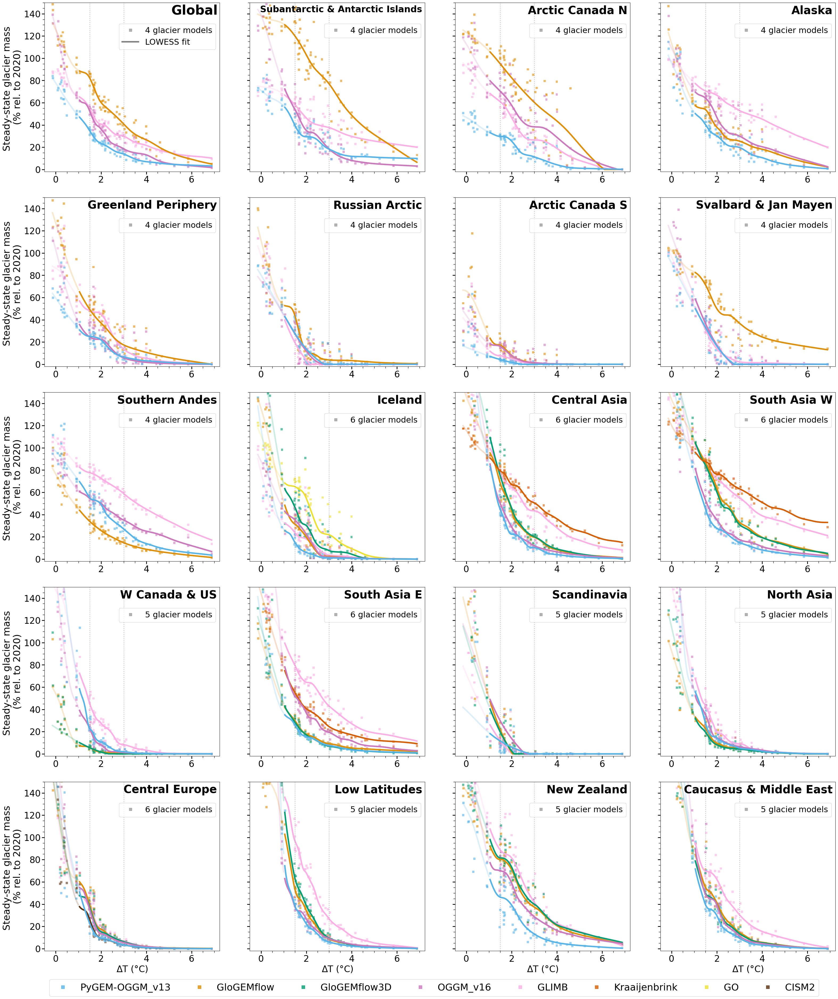

In [123]:
plt.rc('font', size=24) 
fig, axs = plt.subplots(5,4,figsize=(32,38), sharey=True) #, sharey='row') #, sharex=True)

for j, rgi_reg in enumerate(['All'] + list(rgi_regs_sel_sorted_vol)):
    if rgi_reg == 'All':
        _rgi_reg = 'Globally'
    else:
        _rgi_reg = rgi_reg
    vol_2020_reg = pd_rgi_stats_w_hugonnet.loc[_rgi_reg][f'regional_volume_m3_2020{approach}']

    if j<4:
        ax = axs[0][j]
    elif j <8:
        ax = axs[1][j-4]
    elif j <12:
        ax = axs[2][j-8]
    elif j <16:
        ax = axs[3][j-12]
    elif j <20:
        ax = axs[4][j-16]

    region = f'RGI{rgi_reg}_glacier'

    if rgi_reg == 'All':
        # get the temp.
        if temp_ch != 'regional_glacier':
            pd_global_temp_exp_m = get_glob_temp_exp(region='global')
        else:
            pd_global_temp_exp_m = get_glob_temp_exp(region='global_glacier')
        if shift_years:
            # we have done the dropping of everything after 4950, so the last year should be fine 
            ds_reg_models_med_vol_sel = ds_reg_models_med_vol_roll.isel(year_after_2020=-1).sum(dim='rgi_reg')
            # make sure that we only take here global models ... 
            ds_t2 = ds_reg_models_vol_roll.sum(dim='rgi_reg', min_count=19).isel(year_after_2020=-1).dropna(dim='model_author')
            ds_t2 = 100*ds_t2/vol_2020_reg
            ds_t = 100*ds_reg_models_med_vol_sel/vol_2020_reg # TODO checkt that this is the sum ... 

        else:
            ds_reg_models_med_vol_sel = ds_reg_models_med_vol_roll.isel(simulation_year=-1).sum(dim='rgi_reg')
            # make sure that we only take here global models ... 
            ds_t2 = ds_reg_models_vol_roll.sum(dim='rgi_reg', min_count=19).isel(simulation_year=-1).dropna(dim='model_author')
            ds_t2 = 100*ds_t2/ds_reg_models_vol.isel(simulation_year=0).sum(dim='rgi_reg', min_count=19)

            ds_t = 100*ds_reg_models_med_vol_sel/ds_reg_models_med_vol.isel(simulation_year=0).sum(dim='rgi_reg')

        pd_tt2 = ds_t2.to_dataframe()
        try:
            pd_tt2 = pd_tt2.drop(columns=['gcm','period_scenario'])
        except:
            pass
        pd_tt2 = pd_tt2.reset_index()
    else:
        # get the temp. 
        if temp_ch != 'regional_glacier':
            pd_global_temp_exp_m = get_glob_temp_exp(region='global')
        else:
            pd_global_temp_exp_m = get_glob_temp_exp(region=region)

        if fit_to_median:
            if shift_years:
                # TODO
                ds_t2 = ds_reg_models_vol_roll.sel(rgi_reg=rgi_reg).isel(year_after_2020=-1).dropna(dim='model_author')
                ds_t2 = 100*ds_t2/vol_2020_reg
            else:
                ds_t2 = ds_reg_models_vol_roll.sel(rgi_reg=rgi_reg).isel(simulation_year=-1).dropna(dim='model_author')
                ds_t2 = 100*ds_t2/ds_reg_models_vol.isel(simulation_year=0).sel(rgi_reg=rgi_reg)
            ds_t = ds_t2.median(dim='model_author') 

            pd_tt2 = ds_t2.to_dataframe()
            try:
                pd_tt2 = pd_tt2.drop(columns=['gcm','period_scenario'])
            except:
                pass
            pd_tt2 = pd_tt2.reset_index()
        else:
            if shift_years:
                # TODO
                ds_t = ds_reg_models_vol_roll.sel(rgi_reg=rgi_reg).isel(year_after_2020=-1).dropna(dim='model_author')
                ds_t = 100*ds_t/vol_2020_reg
            else:
                ds_t = ds_reg_models_vol_roll.sel(rgi_reg=rgi_reg).isel(simulation_year=-1).dropna(dim='model_author')
                ds_t = 100*ds_t/ds_reg_models_vol.isel(simulation_year=0).sel(rgi_reg=rgi_reg)
            ds_t2= ds_t
    pd_tt = ds_t2.to_dataframe()
    try:
        pd_tt = pd_tt.drop(columns=['gcm','period_scenario'])
    except:
        pass
    pd_tt = pd_tt.reset_index()
    # much better if we create a gcm_period_scenario column to later assign the correct temp. series ... 
    pd_global_temp_exp_m_r = pd_global_temp_exp_m.reset_index()
    pd_global_temp_exp_m_r['gcm'+'_'+'period_scenario'] = pd_global_temp_exp_m_r['gcm'] +'_'+pd_global_temp_exp_m_r['period_scenario']
    pd_global_temp_exp_m_r.index = pd_global_temp_exp_m_r['gcm'+'_'+'period_scenario']
    pd_tt2['gcm'+'_'+'period_scenario'] = pd_tt2['gcm'] +'_'+pd_tt2['period_scenario']
    pd_tt2.index = pd_tt2['gcm'+'_'+'period_scenario']
    pd_tt2.loc[pd_global_temp_exp_m_r.index, 'temp_ch_ipcc'] = pd_global_temp_exp_m_r['temp_ch_ipcc']
    pd_tt2 = pd_tt2.reset_index(drop=True)

    pd_tt['gcm'+'_'+'period_scenario'] = pd_tt['gcm'] +'_'+pd_tt['period_scenario']
    pd_tt.index = pd_tt['gcm'+'_'+'period_scenario']
    pd_tt.loc[pd_global_temp_exp_m_r.index, 'temp_ch_ipcc'] = pd_global_temp_exp_m_r['temp_ch_ipcc']
    pd_tt = pd_tt.reset_index(drop=True)


    pd_tt_above0 = pd_tt #.loc[pd_tt.volume_m3>0]  ## probably it is ok to also fit the zero volume estimates 
    # if I want to remove the very uncertain experiments,
    # I still want to keep those that are near to 
    # 1.2°C. However, there are no experiments directly at 1.2°C
    # and only one at +1, so, we should rather do the fit with >= +0.8°C
    if temp_above_0_8:
        pd_tt_above0 = pd_tt_above0.loc[pd_tt_above0['temp_ch_ipcc']>=0.8]
    temp = pd_tt_above0['temp_ch_ipcc'].values

    q = 'volume_m3' # this is actually the 'relative volume change (in %)'
    rel_vol = pd_tt_above0[q].values

    ax.set_ylabel(f'{state} '+'\n(% rel. to 2020)', fontsize=26)

    if show_color_models:                    
        if rgi_reg=='All' and show_median:
            pd_ttx = pd_tt2
            pd_ttxx = pd_tt
            # add legend...
            n_models = len(pd_ttx.model_author.unique())

            line2 = Line2D([0], [0], label=f'{n_models} individual global models', color='grey', ms=7, marker='s', lw=0,alpha = 0.6)
            #add handles
            if show_median:
                line1 = Line2D([0], [0],
                               label='global model median:\n'+r'$\sum_{rgi=1}^{19} V_{median,rgi}$',
                               color='black', ms=10, marker='o', lw=0,alpha = 0.8)
                handles= [line1, line2]
            else:
                handles = [line2]
            #add legend
            leg2=ax.legend(handles=handles, loc = 'upper right', fontsize=16, bbox_to_anchor=(1,0.55))
        else:
            if fit_to_median:
                pd_ttx = pd_tt2
                pd_ttxx = pd_tt
            else:
                pd_ttx = pd_tt
                pd_ttxx = pd_tt[['temp_ch_ipcc', 'volume_m3']].groupby(['temp_ch_ipcc']).median().reset_index()
            n_models = len(pd_ttx.model_author.unique())
            


        sns.scatterplot(ax=ax,x='temp_ch_ipcc',
                        y='volume_m3', #'volume (km3)',
                        data = pd_ttx,
                        hue_order=hue_order,
                        hue='model_author',
                        palette=pal_models,
                        legend=False, s=40, alpha = 0.6, marker='s')
        # if globally, the median comes from all estimates (also from those models that are only available for some RGI regions ...)
        if show_median:
            sns.scatterplot(ax=ax,
                        x='temp_ch_ipcc',
                        y='volume_m3', #'volume (km3)',
                        data = pd_ttxx,
                        color='black',
                        #hue='temp_ch_ipcc',
                        #palette='flare',
                        legend=False, s=80, alpha = 0.8)

    else:
        sns.scatterplot(ax=ax,
                    x='temp_ch_ipcc',
                    y='volume_m3', #'volume (km3)',
                    data = pd_tt,
                    color='black',
                    #hue='temp_ch_ipcc',
                    #palette='flare',
                    legend=False, s=80, alpha = 0.3)

    ax.set_xlabel(r'$\Delta$T (°C)')


    for m in pd_tt_above0.model_author.unique():

        rel_vol_m = pd_tt_above0.loc[pd_tt_above0.model_author==m].volume_m3.values #[q]
        temp_m = pd_tt_above0.loc[pd_tt_above0.model_author==m].temp_ch_ipcc.values
        x,y = temp_m, rel_vol_m

        # Perform the curve fitting
        popt, pcov = curve_fit(exponential_decay, x-current_deltaT, y,loss='soft_l1', f_scale=0.1, bounds = param_bounds)  # Lower and upper bounds for a and b)
        # Generate a higher density x range for plotting the fitted curve
        x_dense = np.linspace(x.min(), x.max(), 100)
        fit_vars = popt #c_opt

        # Extract the optimized parameters
        a_opt, b_opt = popt #c_opt
        # Compute the fitted y values
        y_fitted = exponential_decay(x_dense-current_deltaT, a_opt, b_opt)

        func_vars= r'(ΔT)='+f'{a_opt:.1f}'+r'$\cdot$'+f'exp(-{b_opt:.2f}'+r'$\cdot$ΔT))' #\n+'+f'{c_opt:.1f}*exp(-{d_opt:.2f}*ΔT²)' #+{c_opt:.2f}'
        #r'V$_{ss,rel}$(ΔT)=a$\cdot$e'+r'$^{-b\cdot(ΔT-1.2)}$'
        if current_deltaT !=0:
            if temp_ch == 'regional_glacier':
                #func_vars= r'$V_{\%}$(ΔT$_{reg}$)='+f'{a_opt:.1f}*exp(-{b_opt:.2f}*('+r'ΔT$_{reg}$'+f'-{current_deltaT}°C))' 
                func_vars= r'(ΔT$_{reg}$)='+f'{a_opt:.1f}'+r'$\cdot$'+f'exp(-{b_opt:.2f}'+r'$\cdot$(ΔT$_{reg}$-'+f'{current_deltaT}°C))'
                fs_label = 14
            else:
                #func_vars= r'$V_{\%}$(ΔT)='+f'{a_opt:.1f}*exp(-{b_opt:.2f}*(ΔT-{current_deltaT}°C))' 
                func_vars= r'(ΔT)='+f'{a_opt:.1f}'+r'$\cdot$'+f'exp(-{b_opt:.2f}'+r'$\cdot$(ΔT-'+f'{current_deltaT}°C))'
                fs_label = 18
                #\n+'+f'{c_opt:.1f}*exp(-{d_opt:.2f}*ΔT²)' #+{c_opt:.2f}'
        if show_exp:
            ax.plot(x_dense, y_fitted, '--', label=func_vars,
                    color=dict_model_col[m], lw=4)


        


        sel = pd_sel.loc[pd_sel.region == rgi_reg].copy()
        sel = sel.loc[sel.model_author==m]
        ax.plot(sel.loc[sel.x<=1].x, sel.loc[sel.x<=1]['0.5'], color=dict_model_col[m], lw=4, alpha = 0.2)
        ax.plot(sel.loc[sel.x>1].x, sel.loc[sel.x>1]['0.5'], color=dict_model_col[m], lw=4)
        
    ax.set_ylim([-2,150])
    if temp_ch == 'regional_glacier':
        ax.set_xlim([pd_global_temp_exp_glac['temp_ch_ipcc'].min()*1.001, pd_global_temp_exp_glac['temp_ch_ipcc'].max()*1.001])
        ax.set_ylim([-2,400])
    else:
        ax.set_ylim([-2,150])

    if j<16:
        ax.set_xlabel('')
    if j not in [0,4,8,12,16,20]:
        ax.set_ylabel('')
    ax.tick_params(axis='both', which='major', width=2, length=7)
    ax.tick_params(axis='both', which='minor', width=1, length=5)
    minorx_locator = MultipleLocator(1)  # 1° difference 
    ax.xaxis.set_minor_locator(minorx_locator)
    minory_locator = MultipleLocator(10)  # 1° difference 
    ax.yaxis.set_minor_locator(minory_locator)
    ax.minorticks_on()


    if rgi_reg == 'All':
        ax.text(0.99, 0.99, 'Global', color='black',weight='bold',
                transform=ax.transAxes, fontsize=35, va='top', ha='right')
    else:
        nam = d_reg_num_name[rgi_reg]
        if rgi_reg == '19':
            fs_rgi = 24
        else:
            fs_rgi = 30

        fs_add = 2
        ax.text(0.985, 0.985, f'{nam}', color='black', 
                weight='bold',transform=ax.transAxes, fontsize=fs_rgi, va='top', ha='right') # {rgi_reg}-
        
    ax.axvline(1.5,ls=':', lw=2, alpha = 0.5, color='grey')
    ax.axvline(3.0,ls=':', lw=2, alpha = 0.5, color='grey')
    if rgi_reg == 'All':
        
        line1 = Line2D([0], [0], color='grey', ms=7, marker='s', lw=0,alpha = 0.6)
        line2 = Line2D([0], [0], color='grey', lw=4),
        handles = [line1, line2]
        labels = [f'{n_models} glacier models','LOWESS fit']
        leg2=ax.legend(handles, labels,#title='glacier models',
                       loc = 'upper right', fontsize=22, bbox_to_anchor=(1,0.9))
    else:
        line1 = Line2D([0], [0], color='grey', ms=7, marker='s', lw=0,alpha = 0.6)
        handles = [line1]
        labels = [f'{n_models} glacier models']
        leg2=ax.legend(handles, labels,#title='glacier models',
                       loc = 'upper right', fontsize=22, bbox_to_anchor=(1,0.9))
        if rgi_reg == '11':
            leg_add = leg2

plt.tight_layout(rect=(0,0.017,1,1))

handles = []
labels = []
for m in dict_model_col.keys():
    line = Line2D([0], [0], color=dict_model_col[m], ms=8, marker='s', lw=0, alpha = 0.8)
    if m=='Kraaijenbrink':
        label='Kraaijenbrink' #RA2017'
    else:
        label = m
    handles.append(line)
    labels.append(label)
axs[4][0].legend(handles, labels,#title='glacier models',
            loc = 'upper left', fontsize=26, bbox_to_anchor=(0,-0.14), ncol=8)
axs[4][0].add_artist(leg_add)
plt.savefig('../figures/2a_lowess_fits/suppl_per_model_lowess_fit.png')
plt.savefig('../figures/2a_lowess_fits/suppl_per_model_lowess_fit.pdf')

# Problem: the fit does not work so well for some models, specifically below 1.5°C, should we maybe just show it above 1.5°C???

In [72]:
pd_all_lowess = pd.read_csv('/home/users/lschuster/GlacierMIP3/2023_exploratory_analysis_notebooks/per_glacier_lowess_calib/'+
            'fitted_per_model_lowess_shift_years_rel_2020_101yr_avg_period_lowess_added_current12deg_5000_Feb12_2024_ipcc_ar6.csv')

/tmp/ipykernel_2491337/2436927057.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  pd_all_lowess = pd.read_csv('/home/users/lschuster/GlacierMIP3/2023_exploratory_analysis_notebooks/per_glacier_lowess_calib/'+


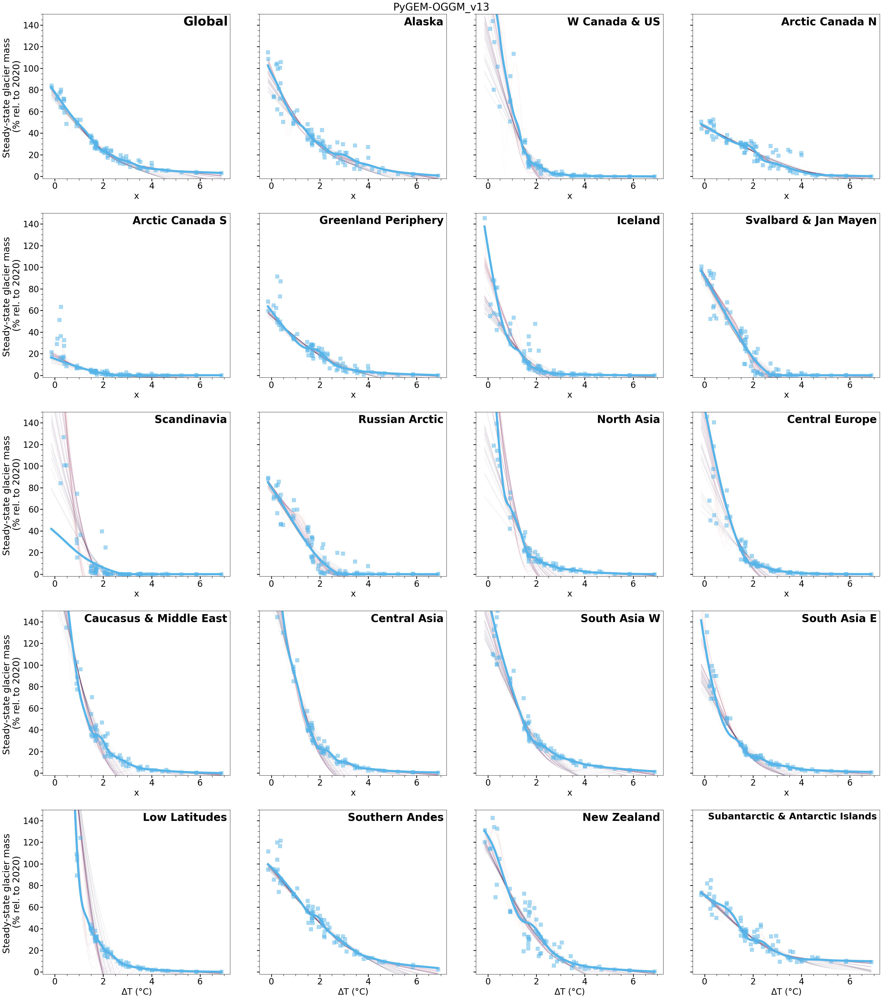

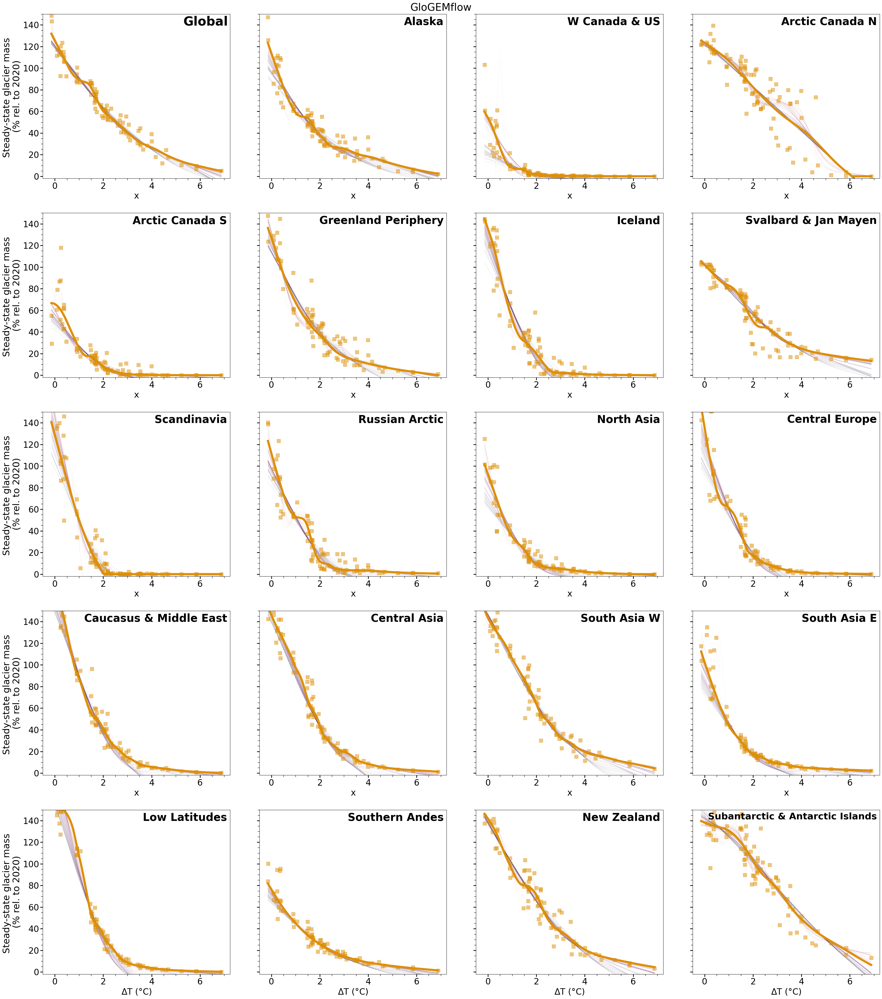

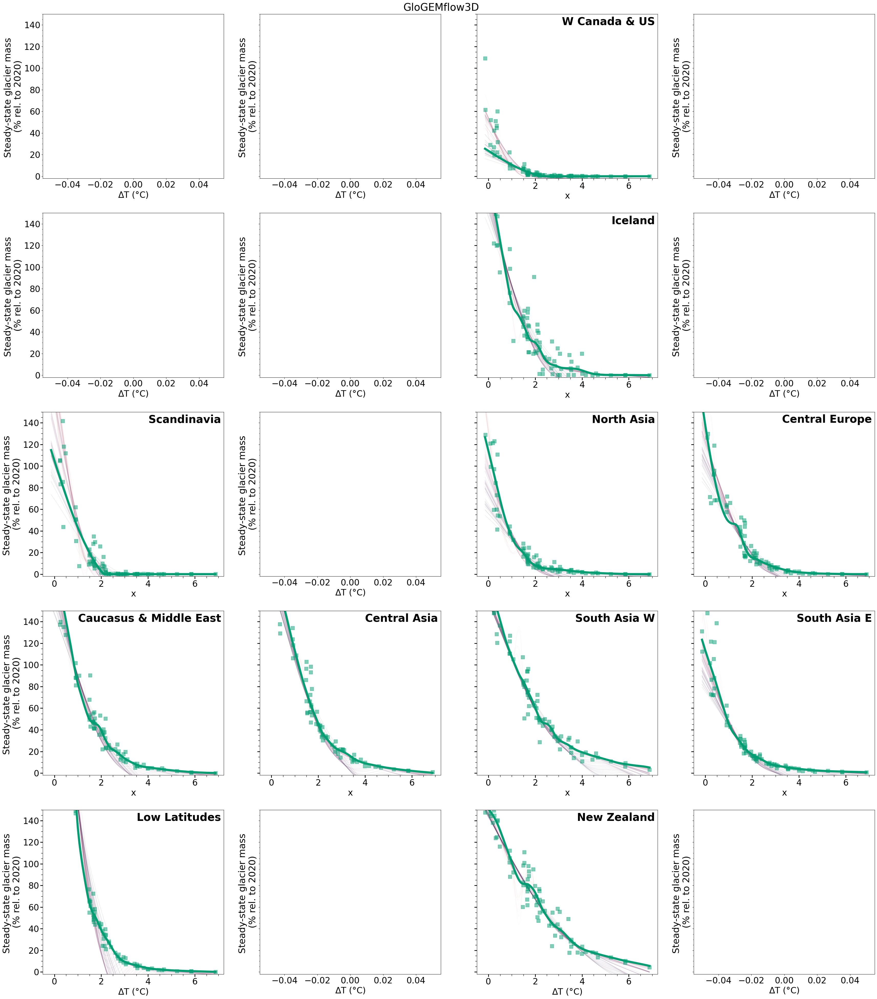

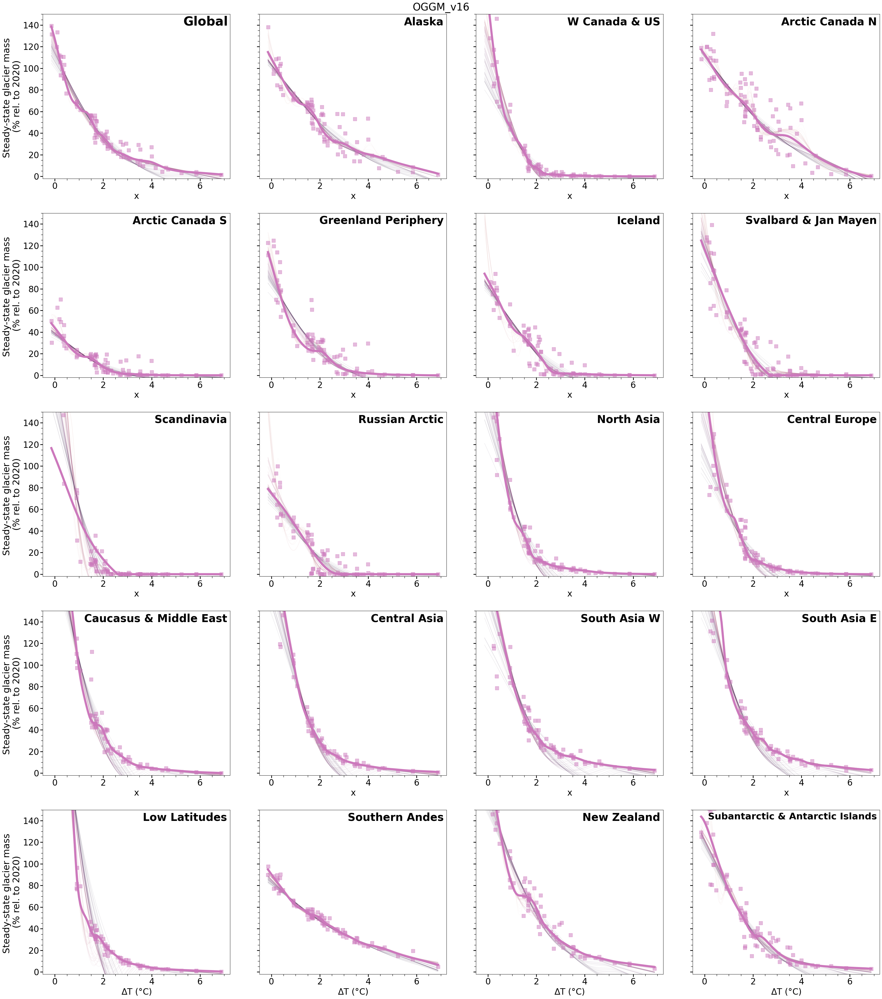

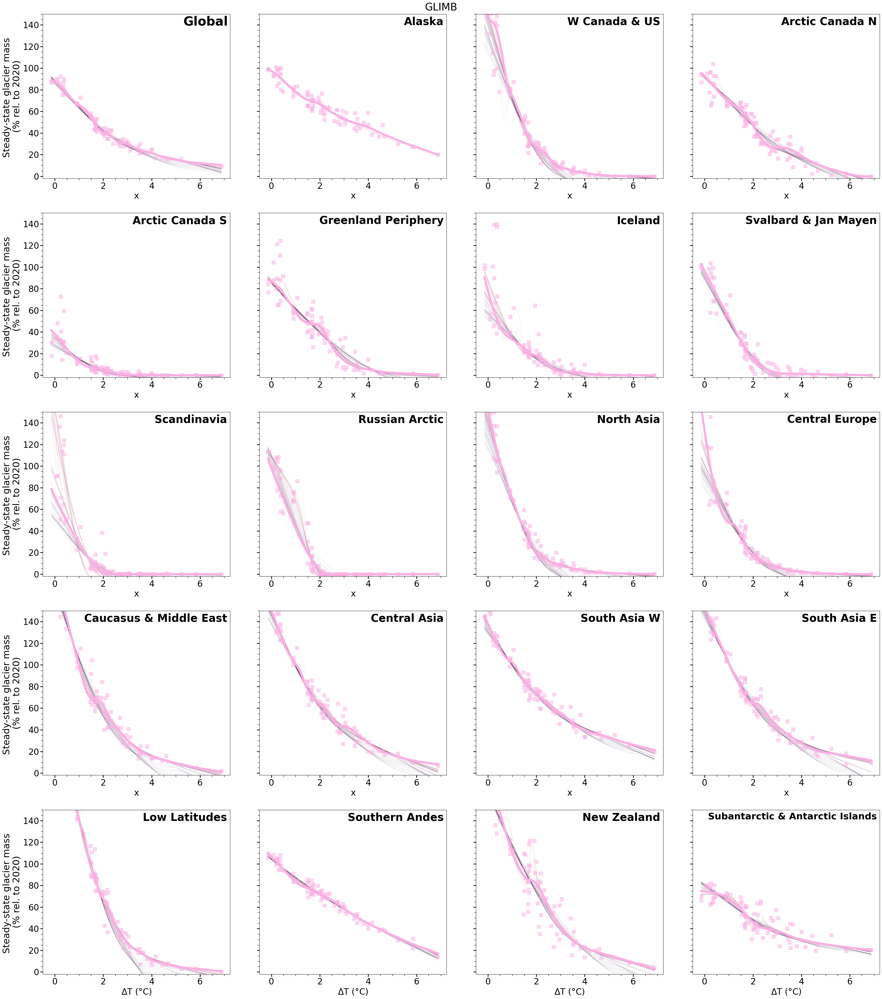

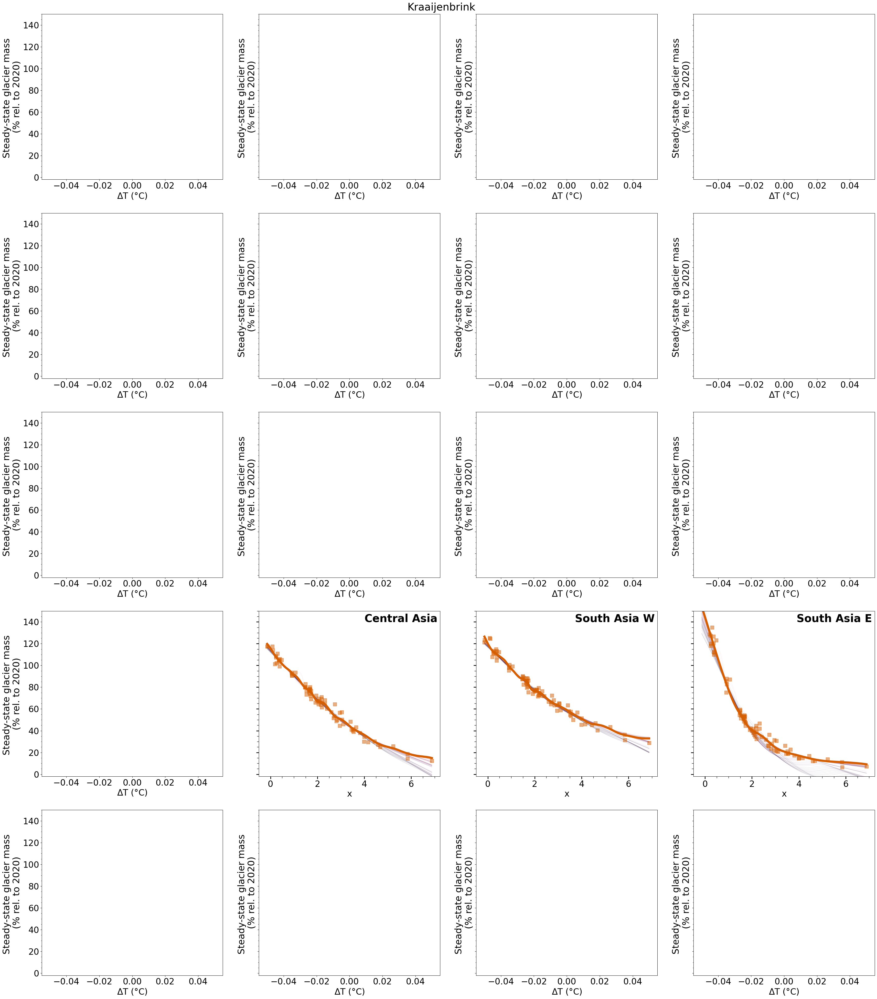

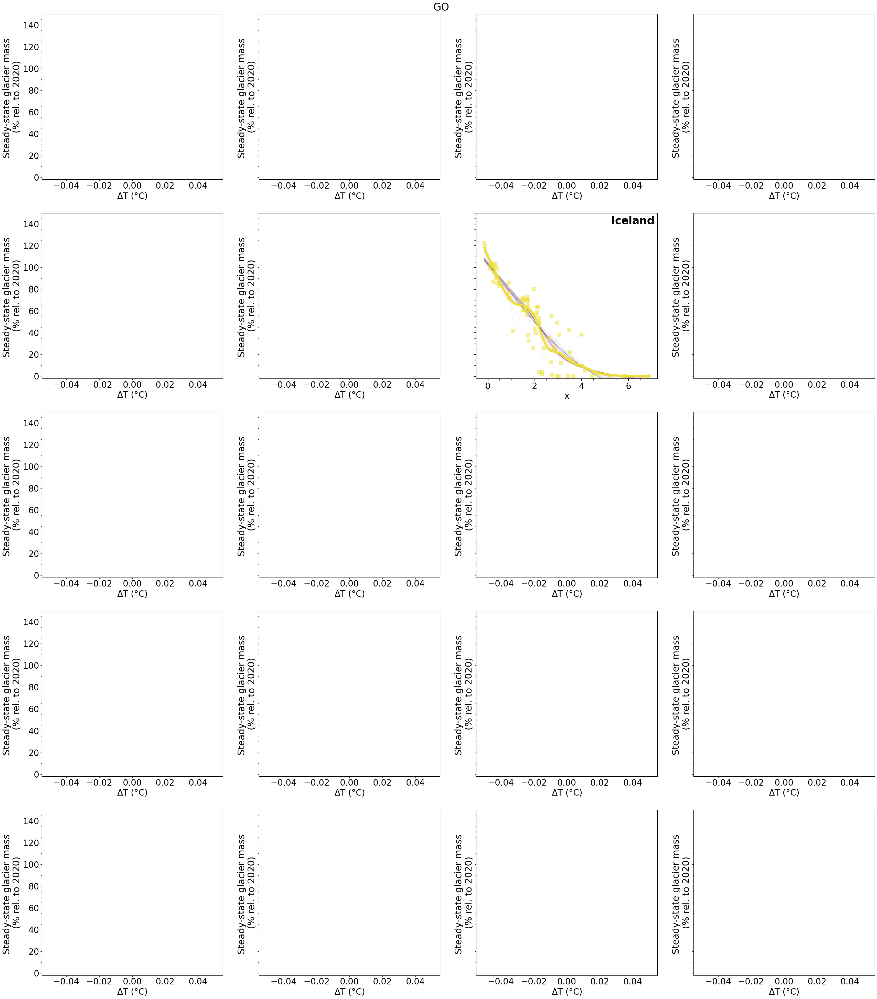

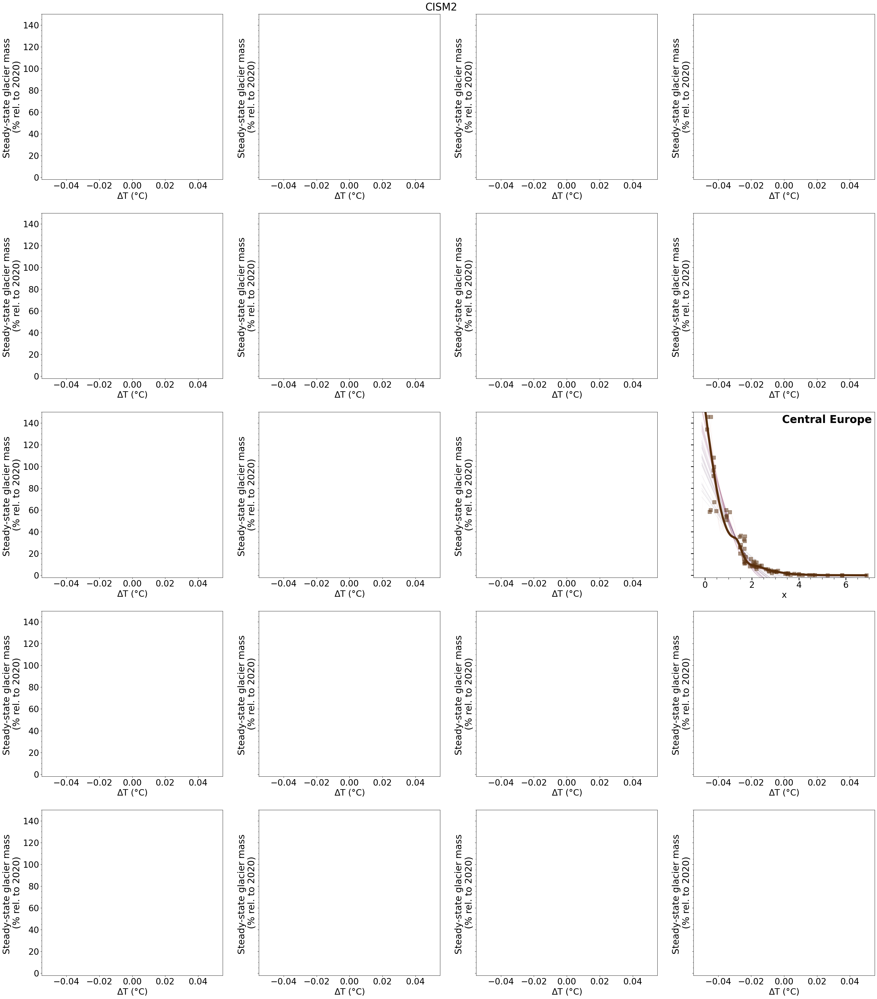

In [93]:
for m in model_order[:-3]:

    fig, axs = plt.subplots(5,4,figsize=(35,40), sharey=True) #, sharey='row') #, sharex=True)

    for j, rgi_reg in enumerate(rgi_regs_global):
        try:
            if rgi_reg == 'All':
                _rgi_reg = 'Globally'
            else:
                _rgi_reg = rgi_reg
            vol_2020_reg = pd_rgi_stats_w_hugonnet.loc[_rgi_reg][f'regional_volume_m3_2020{approach}']

            if j<4:
                ax = axs[0][j]
            elif j <8:
                ax = axs[1][j-4]
            elif j <12:
                ax = axs[2][j-8]
            elif j <16:
                ax = axs[3][j-12]
            elif j <20:
                ax = axs[4][j-16]

            region = f'RGI{rgi_reg}_glacier'

            if rgi_reg == 'All':
                # get the temp.
                if temp_ch != 'regional_glacier':
                    pd_global_temp_exp_m = get_glob_temp_exp(region='global')
                else:
                    pd_global_temp_exp_m = get_glob_temp_exp(region='global_glacier')
                if shift_years:
                    # we have done the dropping of everything after 4950, so the last year should be fine 
                    ds_reg_models_med_vol_sel = ds_reg_models_med_vol_roll.isel(year_after_2020=-1).sum(dim='rgi_reg')
                    # make sure that we only take here global models ... 
                    ds_t2 = ds_reg_models_vol_roll.sum(dim='rgi_reg', min_count=19).isel(year_after_2020=-1).dropna(dim='model_author')
                    ds_t2 = 100*ds_t2/vol_2020_reg
                    ds_t = 100*ds_reg_models_med_vol_sel/vol_2020_reg # TODO checkt that this is the sum ... 

                else:
                    ds_reg_models_med_vol_sel = ds_reg_models_med_vol_roll.isel(simulation_year=-1).sum(dim='rgi_reg')
                    # make sure that we only take here global models ... 
                    ds_t2 = ds_reg_models_vol_roll.sum(dim='rgi_reg', min_count=19).isel(simulation_year=-1).dropna(dim='model_author')
                    ds_t2 = 100*ds_t2/ds_reg_models_vol.isel(simulation_year=0).sum(dim='rgi_reg', min_count=19)

                    ds_t = 100*ds_reg_models_med_vol_sel/ds_reg_models_med_vol.isel(simulation_year=0).sum(dim='rgi_reg')

                pd_tt2 = ds_t2.to_dataframe()
                try:
                    pd_tt2 = pd_tt2.drop(columns=['gcm','period_scenario'])
                except:
                    pass
                pd_tt2 = pd_tt2.reset_index()
            else:
                # get the temp. 
                if temp_ch != 'regional_glacier':
                    pd_global_temp_exp_m = get_glob_temp_exp(region='global')
                else:
                    pd_global_temp_exp_m = get_glob_temp_exp(region=region)

                if fit_to_median:
                    if shift_years:
                        # TODO
                        ds_t2 = ds_reg_models_vol_roll.sel(rgi_reg=rgi_reg).isel(year_after_2020=-1).dropna(dim='model_author')
                        ds_t2 = 100*ds_t2/vol_2020_reg
                    else:
                        ds_t2 = ds_reg_models_vol_roll.sel(rgi_reg=rgi_reg).isel(simulation_year=-1).dropna(dim='model_author')
                        ds_t2 = 100*ds_t2/ds_reg_models_vol.isel(simulation_year=0).sel(rgi_reg=rgi_reg)
                    ds_t = ds_t2.median(dim='model_author') 

                    pd_tt2 = ds_t2.to_dataframe()
                    try:
                        pd_tt2 = pd_tt2.drop(columns=['gcm','period_scenario'])
                    except:
                        pass
                    pd_tt2 = pd_tt2.reset_index()
                else:
                    if shift_years:
                        # TODO
                        ds_t = ds_reg_models_vol_roll.sel(rgi_reg=rgi_reg).isel(year_after_2020=-1).dropna(dim='model_author')
                        ds_t = 100*ds_t/vol_2020_reg
                    else:
                        ds_t = ds_reg_models_vol_roll.sel(rgi_reg=rgi_reg).isel(simulation_year=-1).dropna(dim='model_author')
                        ds_t = 100*ds_t/ds_reg_models_vol.isel(simulation_year=0).sel(rgi_reg=rgi_reg)
                    ds_t2= ds_t
            pd_tt = ds_t2.to_dataframe()
            try:
                pd_tt = pd_tt.drop(columns=['gcm','period_scenario'])
            except:
                pass
            pd_tt = pd_tt.reset_index()
            # much better if we create a gcm_period_scenario column to later assign the correct temp. series ... 
            pd_global_temp_exp_m_r = pd_global_temp_exp_m.reset_index()
            pd_global_temp_exp_m_r['gcm'+'_'+'period_scenario'] = pd_global_temp_exp_m_r['gcm'] +'_'+pd_global_temp_exp_m_r['period_scenario']
            pd_global_temp_exp_m_r.index = pd_global_temp_exp_m_r['gcm'+'_'+'period_scenario']
            pd_tt2['gcm'+'_'+'period_scenario'] = pd_tt2['gcm'] +'_'+pd_tt2['period_scenario']
            pd_tt2.index = pd_tt2['gcm'+'_'+'period_scenario']
            pd_tt2.loc[pd_global_temp_exp_m_r.index, 'temp_ch_ipcc'] = pd_global_temp_exp_m_r['temp_ch_ipcc']
            pd_tt2 = pd_tt2.reset_index(drop=True)

            pd_tt['gcm'+'_'+'period_scenario'] = pd_tt['gcm'] +'_'+pd_tt['period_scenario']
            pd_tt.index = pd_tt['gcm'+'_'+'period_scenario']
            pd_tt.loc[pd_global_temp_exp_m_r.index, 'temp_ch_ipcc'] = pd_global_temp_exp_m_r['temp_ch_ipcc']
            pd_tt = pd_tt.reset_index(drop=True)


            pd_tt_above0 = pd_tt #.loc[pd_tt.volume_m3>0]  ## probably it is ok to also fit the zero volume estimates 
            # if I want to remove the very uncertain experiments,
            # I still want to keep those that are near to 
            # 1.2°C. However, there are no experiments directly at 1.2°C
            # and only one at +1, so, we should rather do the fit with >= +0.8°C
            if temp_above_0_8:
                pd_tt_above0 = pd_tt_above0.loc[pd_tt_above0['temp_ch_ipcc']>=0.8]
            temp = pd_tt_above0['temp_ch_ipcc'].values

            q = 'volume_m3' # this is actually the 'relative volume change (in %)'
            rel_vol = pd_tt_above0[q].values

            ax.set_ylabel(f'{state} '+'\n(% rel. to 2020)', fontsize=26)



            ax.set_xlabel(r'$\Delta$T (°C)')


            #for  #pd_tt_above0.model_author.unique():

            rel_vol_m = pd_tt_above0.loc[pd_tt_above0.model_author==m].volume_m3.values #[q]
            temp_m = pd_tt_above0.loc[pd_tt_above0.model_author==m].temp_ch_ipcc.values
            x,y = temp_m, rel_vol_m
            ax.plot(temp_m, rel_vol_m, color=dict_model_col[m], ms=10, marker='s', lw=0, alpha = 0.5)
            # Perform the curve fitting
            popt, pcov = curve_fit(exponential_decay, x-current_deltaT, y,loss='soft_l1', f_scale=0.1, bounds = param_bounds)  # Lower and upper bounds for a and b)
            # Generate a higher density x range for plotting the fitted curve
            x_dense = np.linspace(x.min(), x.max(), 100)
            fit_vars = popt #c_opt

            # Extract the optimized parameters
            a_opt, b_opt = popt #c_opt
            # Compute the fitted y values
            y_fitted = exponential_decay(x_dense-current_deltaT, a_opt, b_opt)

            func_vars= r'(ΔT)='+f'{a_opt:.1f}'+r'$\cdot$'+f'exp(-{b_opt:.2f}'+r'$\cdot$ΔT))' #\n+'+f'{c_opt:.1f}*exp(-{d_opt:.2f}*ΔT²)' #+{c_opt:.2f}'
            #r'V$_{ss,rel}$(ΔT)=a$\cdot$e'+r'$^{-b\cdot(ΔT-1.2)}$'
            if current_deltaT !=0:
                if temp_ch == 'regional_glacier':
                    #func_vars= r'$V_{\%}$(ΔT$_{reg}$)='+f'{a_opt:.1f}*exp(-{b_opt:.2f}*('+r'ΔT$_{reg}$'+f'-{current_deltaT}°C))' 
                    func_vars= r'(ΔT$_{reg}$)='+f'{a_opt:.1f}'+r'$\cdot$'+f'exp(-{b_opt:.2f}'+r'$\cdot$(ΔT$_{reg}$-'+f'{current_deltaT}°C))'
                    fs_label = 14
                else:
                    #func_vars= r'$V_{\%}$(ΔT)='+f'{a_opt:.1f}*exp(-{b_opt:.2f}*(ΔT-{current_deltaT}°C))' 
                    func_vars= r'(ΔT)='+f'{a_opt:.1f}'+r'$\cdot$'+f'exp(-{b_opt:.2f}'+r'$\cdot$(ΔT-'+f'{current_deltaT}°C))'
                    fs_label = 18
                    #\n+'+f'{c_opt:.1f}*exp(-{d_opt:.2f}*ΔT²)' #+{c_opt:.2f}'
            if show_exp:
                ax.plot(x_dense, y_fitted, '--', label=func_vars,
                        color=dict_model_col[m], lw=4)


            ax.set_ylim([-2,150])
            if temp_ch == 'regional_glacier':
                ax.set_xlim([pd_global_temp_exp_glac['temp_ch_ipcc'].min()*1.001, pd_global_temp_exp_glac['temp_ch_ipcc'].max()*1.001])
                ax.set_ylim([-2,400])
            else:
                ax.set_ylim([-2,150])

            if j<16:
                ax.set_xlabel('')
            if j not in [0,4,8,12,16,20]:
                ax.set_ylabel('')
            ax.tick_params(axis='both', which='major', width=2, length=7)
            ax.tick_params(axis='both', which='minor', width=1, length=5)
            minorx_locator = MultipleLocator(1)  # 1° difference 
            ax.xaxis.set_minor_locator(minorx_locator)
            minory_locator = MultipleLocator(10)  # 1° difference 
            ax.yaxis.set_minor_locator(minory_locator)
            ax.minorticks_on()


            if rgi_reg == 'All':
                ax.text(0.99, 0.99, 'Global', color='black',weight='bold',
                        transform=ax.transAxes, fontsize=35, va='top', ha='right')
            else:
                nam = d_reg_num_name[rgi_reg]
                if rgi_reg == '19':
                    fs_rgi = 26
                else:
                    fs_rgi = 30

                fs_add = 2
                ax.text(0.985, 0.985, f'{nam}', color='black', 
                        weight='bold',transform=ax.transAxes, fontsize=fs_rgi, va='top', ha='right') # {rgi_reg}-


            sel = pd_sel.loc[pd_sel.region == rgi_reg].copy()
            sel = sel.loc[sel.model_author==m]
            ax.plot(sel.x, sel['0.5'], color=dict_model_col[m], lw=6)

            if rgi_reg !='All':
                _r = int(rgi_reg)
            else:
                _r = rgi_reg
            pd_sel_all_lowess = pd_all_lowess.loc[(pd_all_lowess.model_author==m)&(pd_all_lowess.region==_r)]

            sns.lineplot(ax=ax, data = pd_sel_all_lowess, x='x', y='0.5',hue='frac',
                         color=dict_model_col[m], lw=1, alpha = 0.1, legend = False, zorder=0)
        except:
            pass
    plt.suptitle(m)
    plt.tight_layout()
    plt.savefig(f'../figures/2a_lowess_fits/suppl_per_model_lowess_fit_model_{m}.png')
